In [1]:
# Generic imports
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import PIL
import os
from sys import platform
from importlib import reload
import plotly.graph_objects as go

# Local imports
import sys
sys.path.append('../../../')
import stlstuff as sls
import imagestuff as ims
import statstuff as sts
import fourierstuff as fs

In [2]:
%matplotlib notebook

In [3]:
# Have to do this in case of different operating systems
if platform == "linux" or platform == "darwin":
    slash = '/'
else: # This is assumed to be Windows
    slash = '\\'
#print(slash)

In [4]:
# Graphics parameters
fontsize = 10
linewidth = 2
matplotlib.rcParams.update({'font.size': fontsize})

In [5]:
# Specify the file we want to analyze (and output file name)
pwd = os.getcwd(); startpos = len(pwd)-pwd[::-1].find(slash)
case = pwd[startpos:]; print(case)
cwd = os.getcwd(); i = cwd.index('crystals'); case_and_folder = cwd[i+9:]; print(case_and_folder)
Segmentroot='Segments2'; print(Segmentroot)

case3.1 (calibration2)
2023-06-21/case3.1 (calibration2)
Segments2


In [6]:
# Derivative names
Compressedfilename = Segmentroot+'_retrieved.npz'; print (Compressedfilename)
Originalfilename = Segmentroot+'_compr.npz'; print(Originalfilename)
Flattenedfilename = Segmentroot+'_compr_flat.npz'; print(Flattenedfilename)
Filteredfilename = Segmentroot+'_compr_flat_filt.npz'; print(Filteredfilename)

Segments2_retrieved.npz
Segments2_compr.npz
Segments2_compr_flat.npz
Segments2_compr_flat_filt.npz


In [7]:
# Get the retrieved surface
npzfile = np.load(Compressedfilename)
imageroot = np.array_str(npzfile['imageroot'])
dx,dy,cA,cB,cC,cD,Filename = ims.getc2('', 'SEMimages/', imageroot)
print("dx and dy", dx, dy)

SEMimages/case3.1-A.bmp
SEMimages/case3.1-B.bmp
SEMimages/case3.1-C.bmp
SEMimages/case3.1-D.bmp
dx and dy 1.2402339999999998 1.2402339999999998


In [8]:
nx1list = npzfile['nx1list']
nx2list = npzfile['nx2list']
ny1list = npzfile['ny1list']
ny2list = npzfile['ny2list']
solution = npzfile['solution']
nsegments = len(nx1list)

<IPython.core.display.Javascript object>


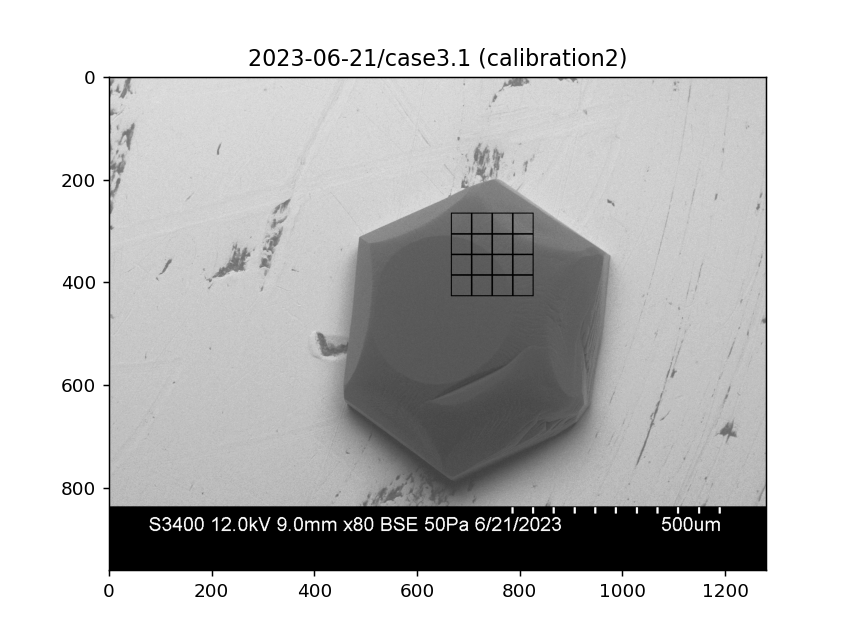

Text(0.5, 1.0, '2023-06-21/case3.1 (calibration2)')

In [9]:
# Graph the segments
im = PIL.Image.open(Filename)
ny_im,nx_im = np.shape(im)
draw = PIL.ImageDraw.Draw(im)
for i in range(nsegments):
    nx1 = nx1list[i]
    nx2 = nx2list[i]
    ny1 = ny1list[i]
    ny2 = ny2list[i]
    ims.myrectangle(draw,(nx1,ny1),(nx2,ny2),2)
plt.imshow(np.asarray(im),cmap = 'Greys_r', vmin = 0,vmax = 255)
plt.title(case_and_folder)

In [10]:
# Flatten them
xseggrid, yseggrid, zseggrid, surf_xseggrid, surf_yseggrid, surf_zseggrid = ims.extractflat(npzfile,dx,dy)

In [11]:
# Report
print(np.shape(zseggrid[0]), \
      xseggrid[0][0,1]-xseggrid[0][0,0],yseggrid[0][1,0]-yseggrid[0][0,0])
print(np.shape(surf_zseggrid[0]), \
      surf_xseggrid[0][0,1]-surf_xseggrid[0][0,0],surf_yseggrid[0][1,0]-surf_yseggrid[0][0,0])

(51, 33) 1.240234 1.2402339999999992
(41, 41) 1.2402339999999998 1.2402339999999998


Working on segment  0
(51, 33)


<IPython.core.display.Javascript object>


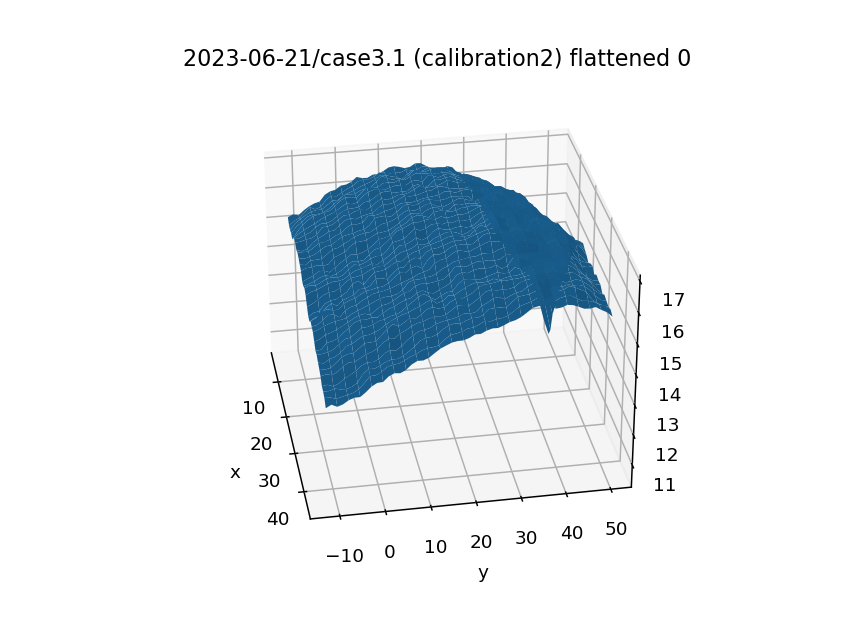

<IPython.core.display.Javascript object>


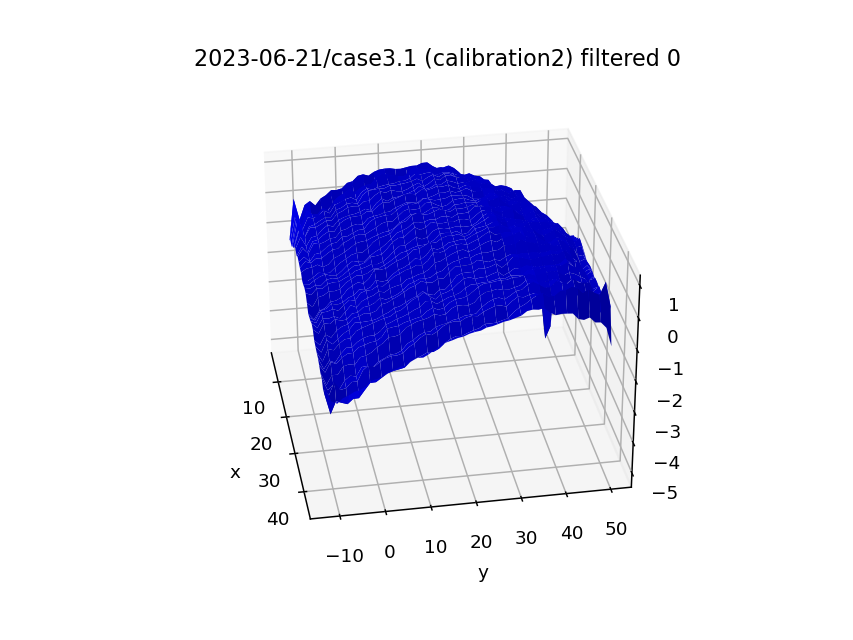

Segments2_compr_flat_filt_0_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.8143188888990525
std dev of height =  0.9444917470144866


<IPython.core.display.Javascript object>


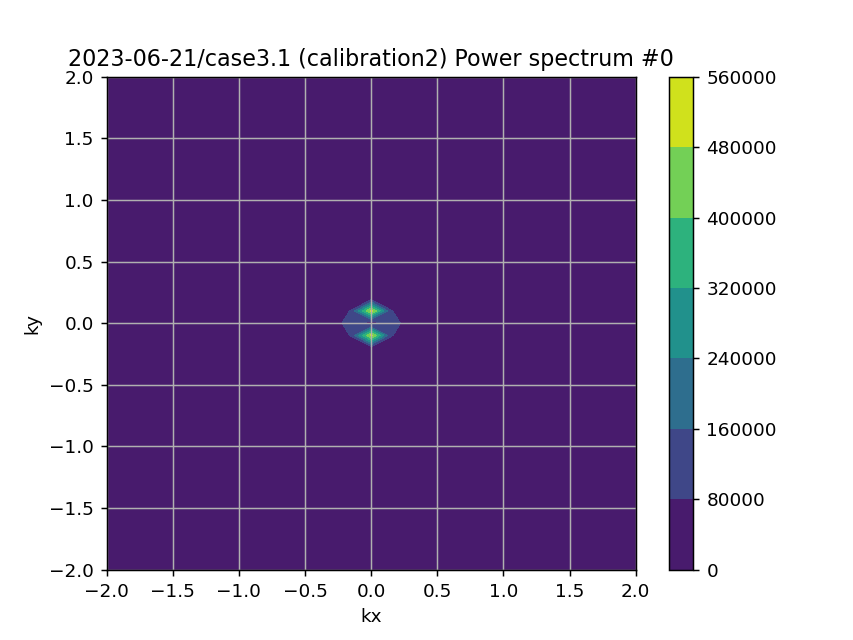

Working on segment  1
(40, 36)


<IPython.core.display.Javascript object>


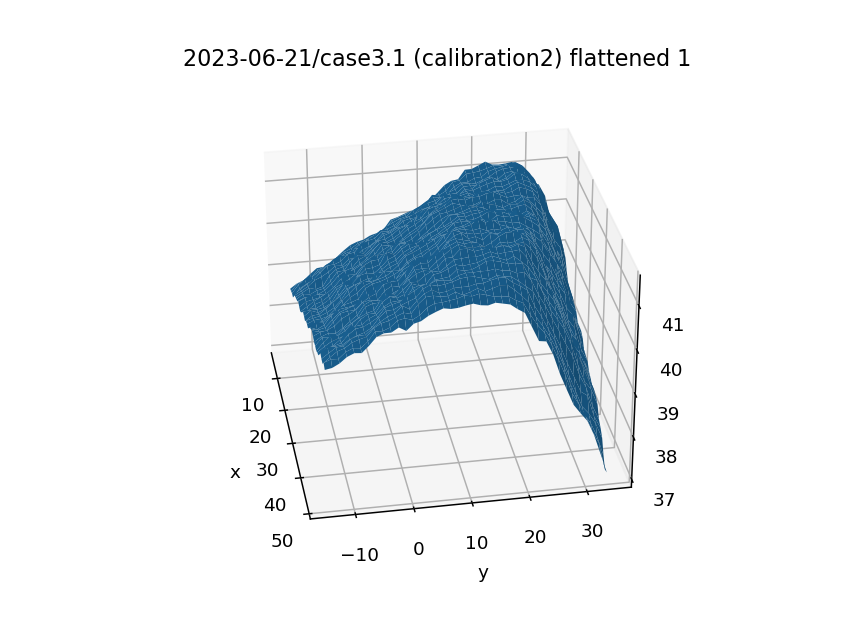

<IPython.core.display.Javascript object>


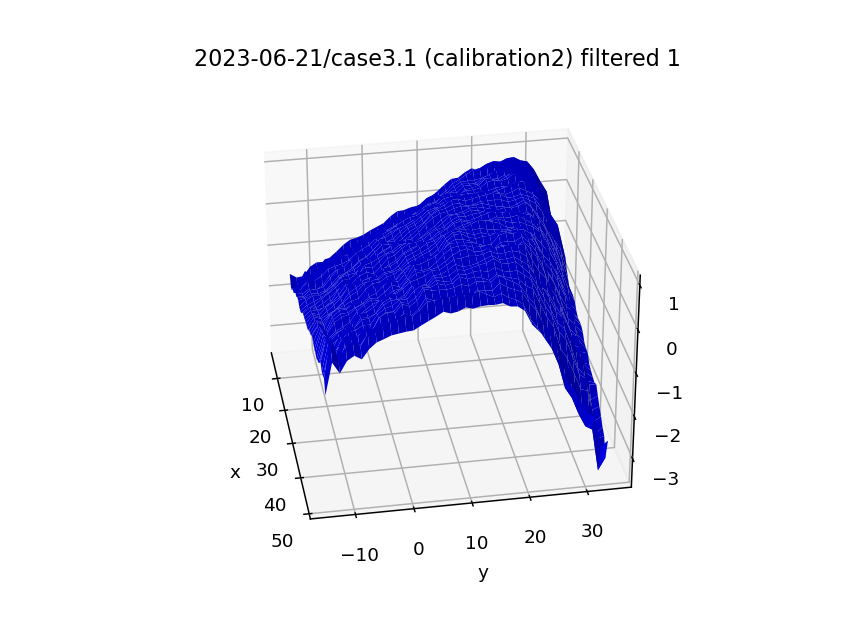

Segments2_compr_flat_filt_1_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.7241078932812148
std dev of height =  0.8441421558977613


<IPython.core.display.Javascript object>


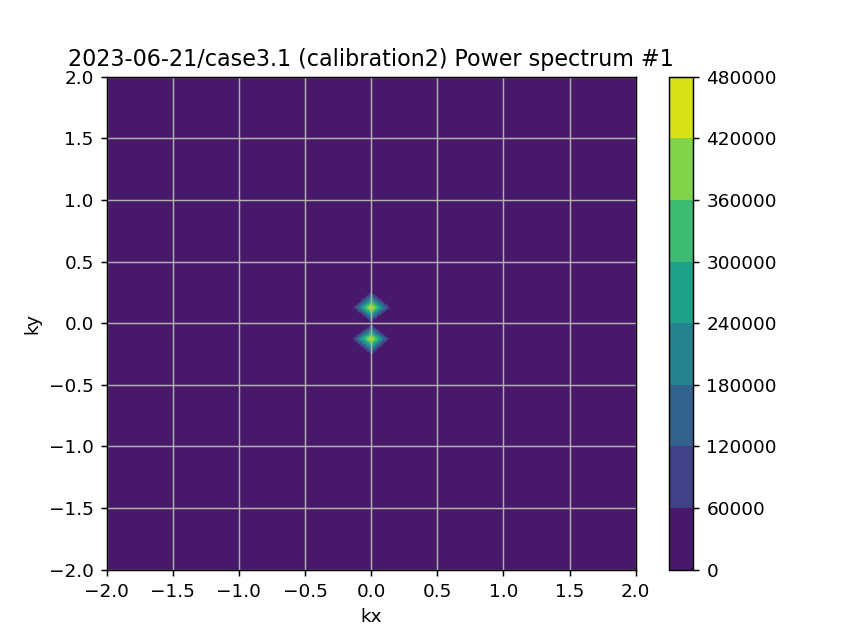

Working on segment  2
(38, 36)


<IPython.core.display.Javascript object>


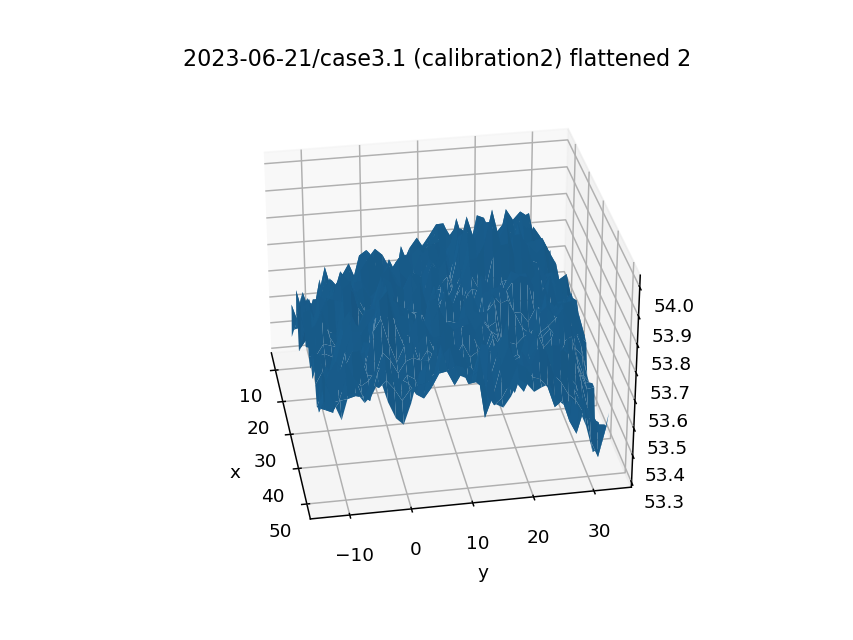

<IPython.core.display.Javascript object>


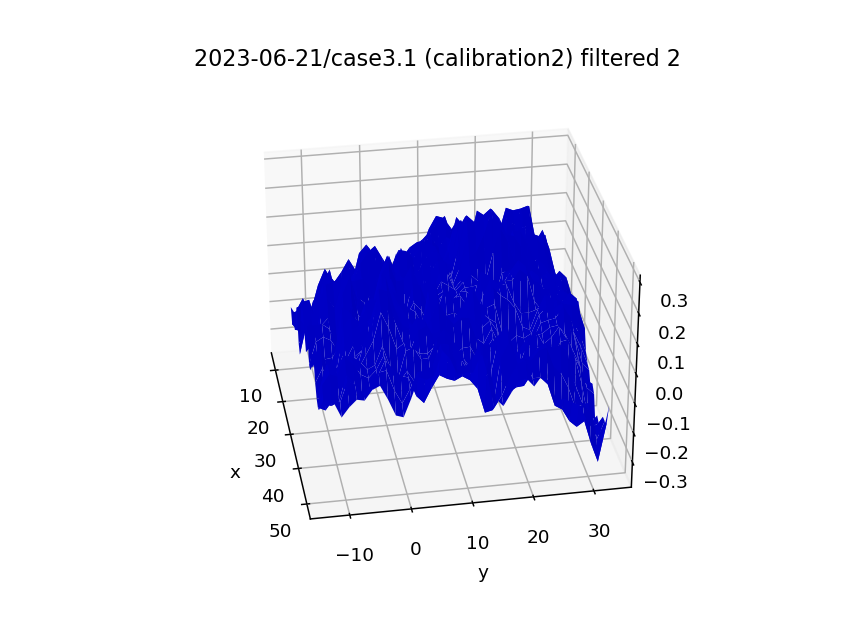

Segments2_compr_flat_filt_2_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.09973524542451263
std dev of height =  0.1100580297971912


<IPython.core.display.Javascript object>


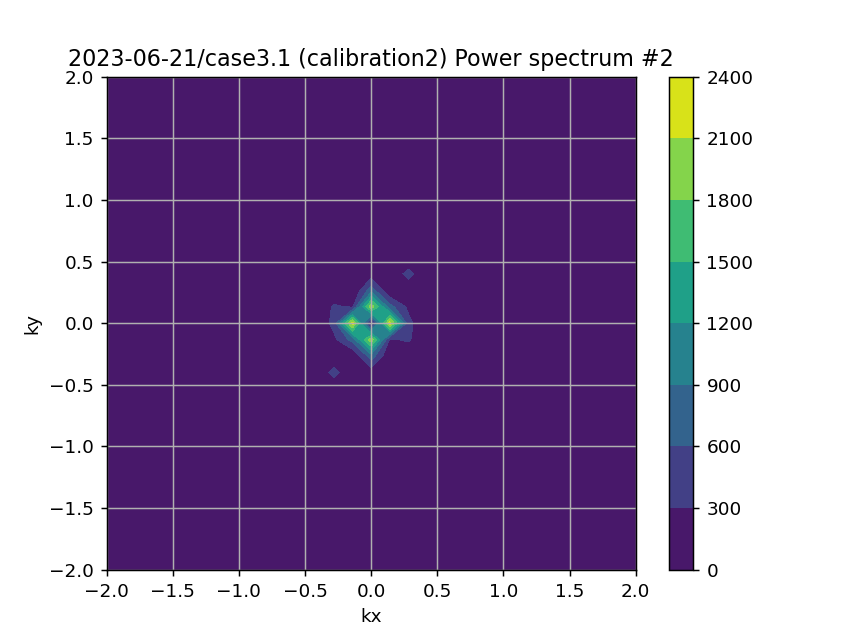

Working on segment  3
(38, 36)


<IPython.core.display.Javascript object>


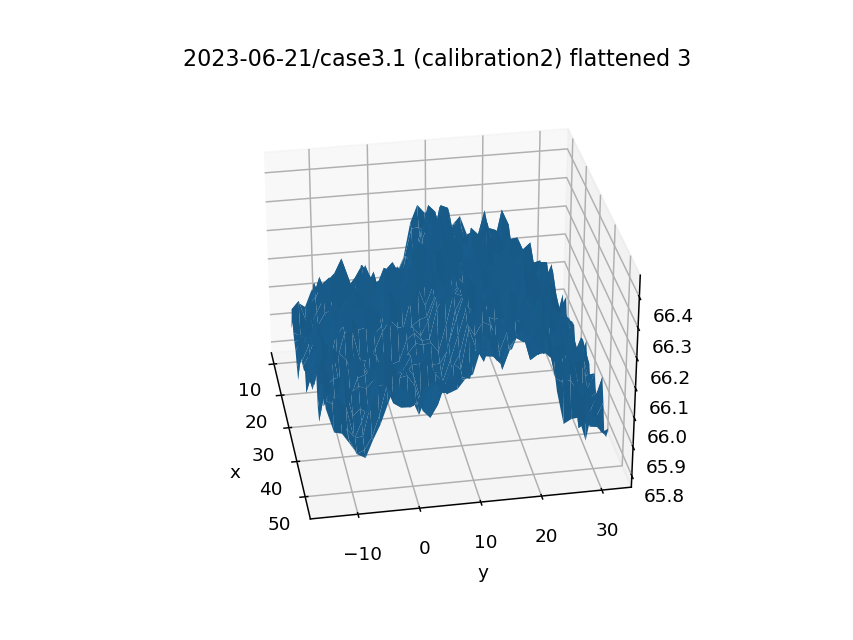

<IPython.core.display.Javascript object>


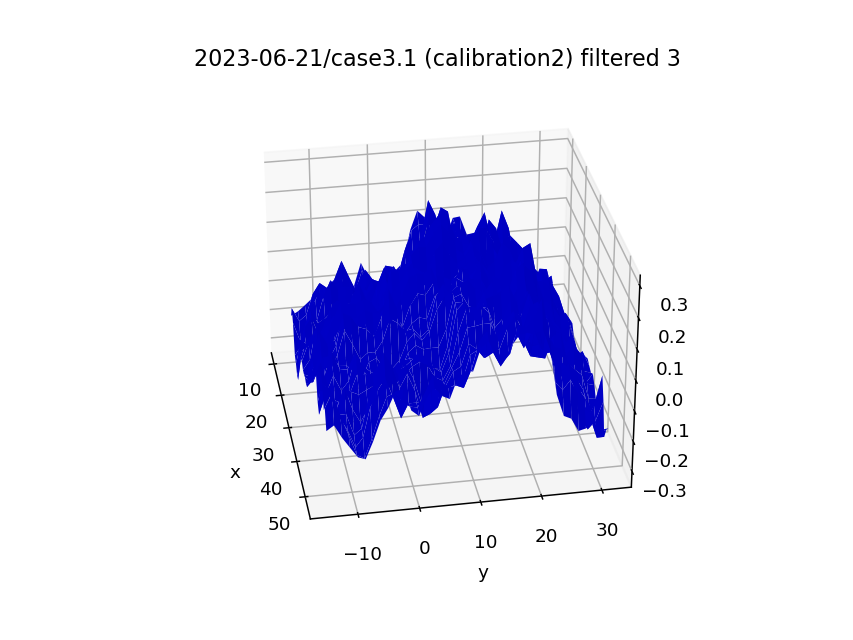

Segments2_compr_flat_filt_3_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.11534159575099381
std dev of height =  0.12468475757193201


<IPython.core.display.Javascript object>


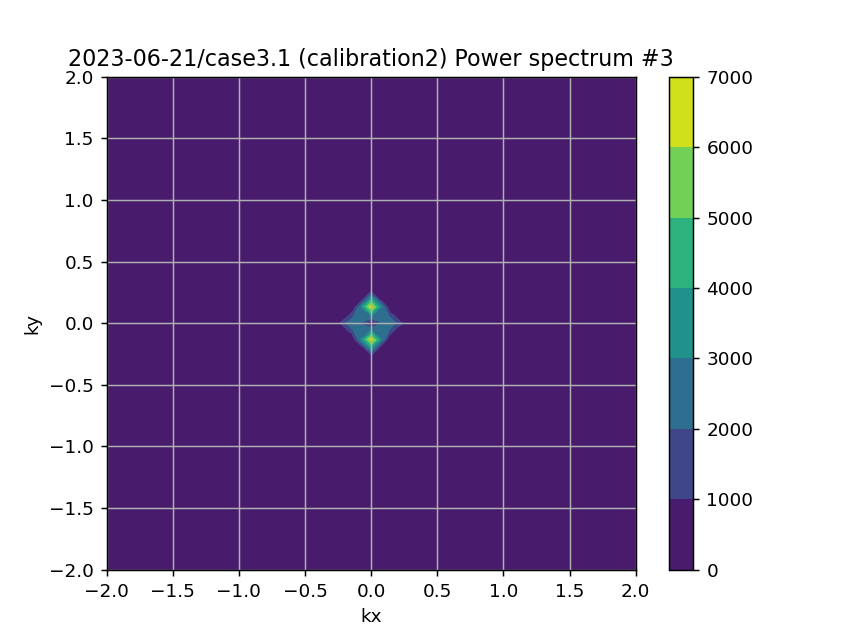

Working on segment  4
(49, 30)


<IPython.core.display.Javascript object>


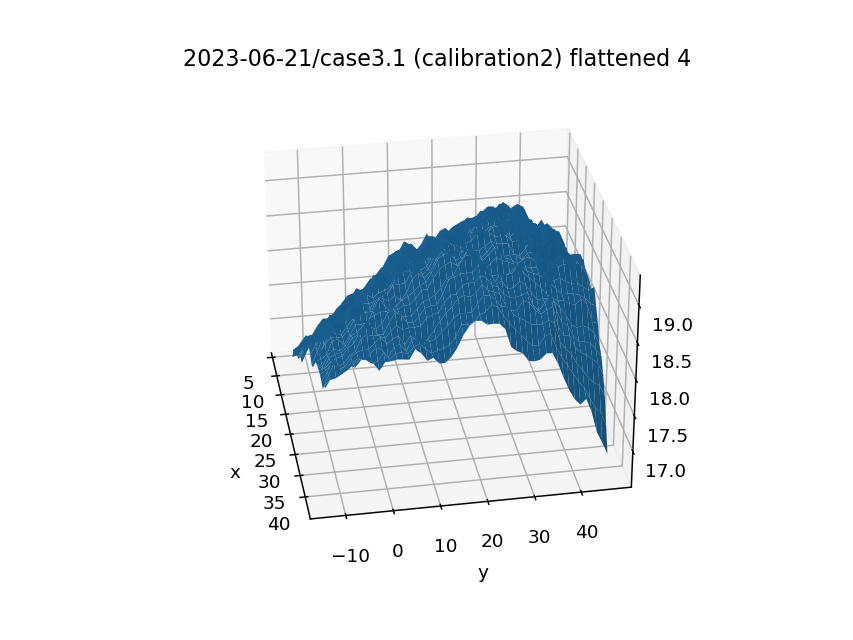

<IPython.core.display.Javascript object>


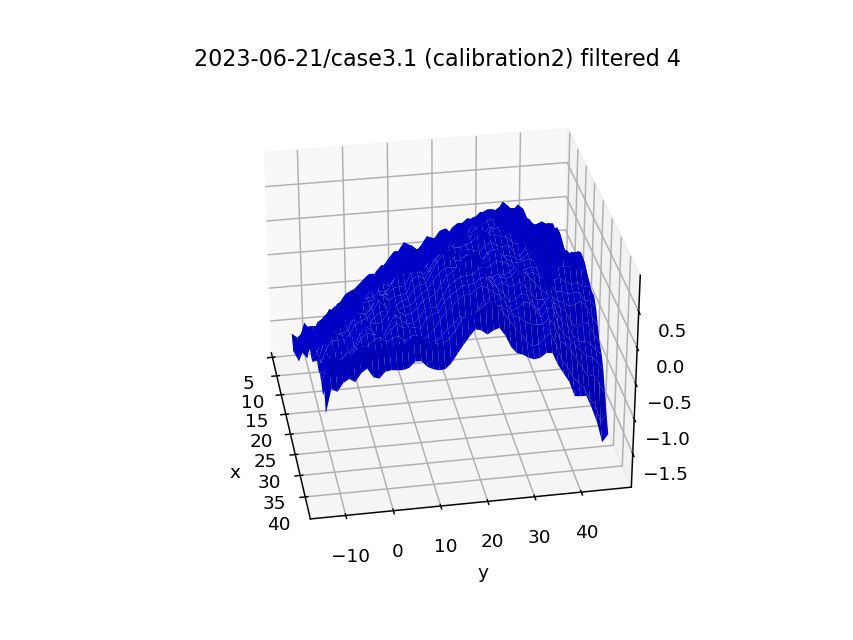

Segments2_compr_flat_filt_4_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.5333294693346005
std dev of height =  0.5573114020395562


<IPython.core.display.Javascript object>


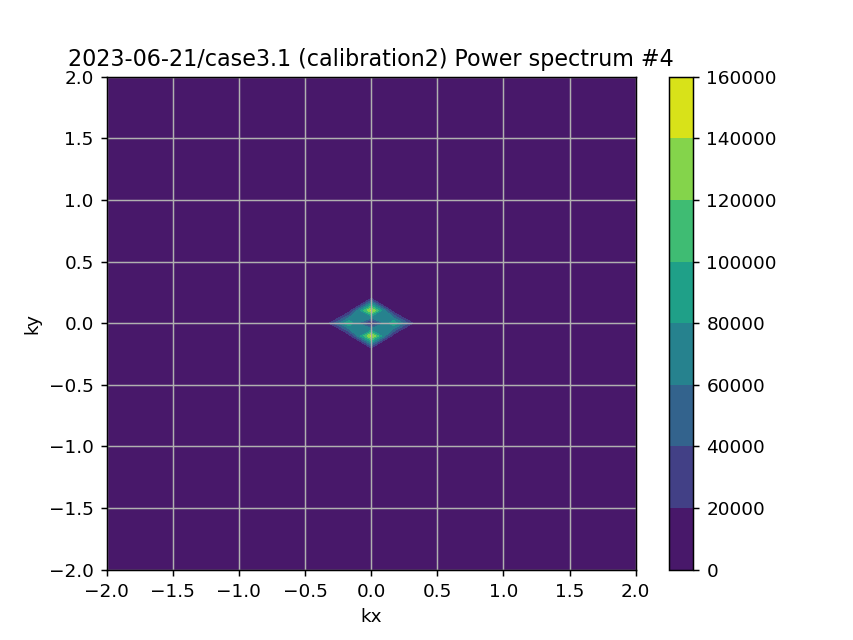

Working on segment  5
(42, 35)


<IPython.core.display.Javascript object>


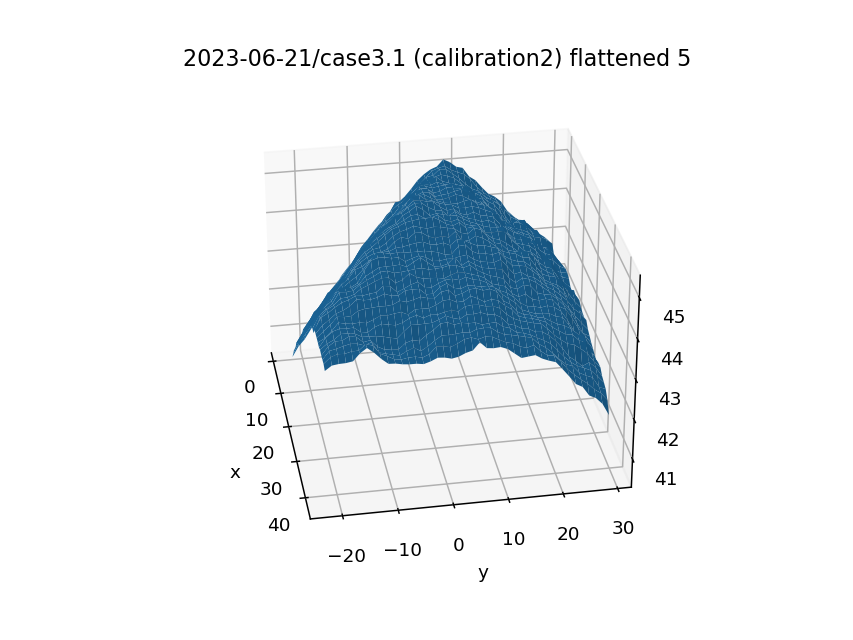

<IPython.core.display.Javascript object>


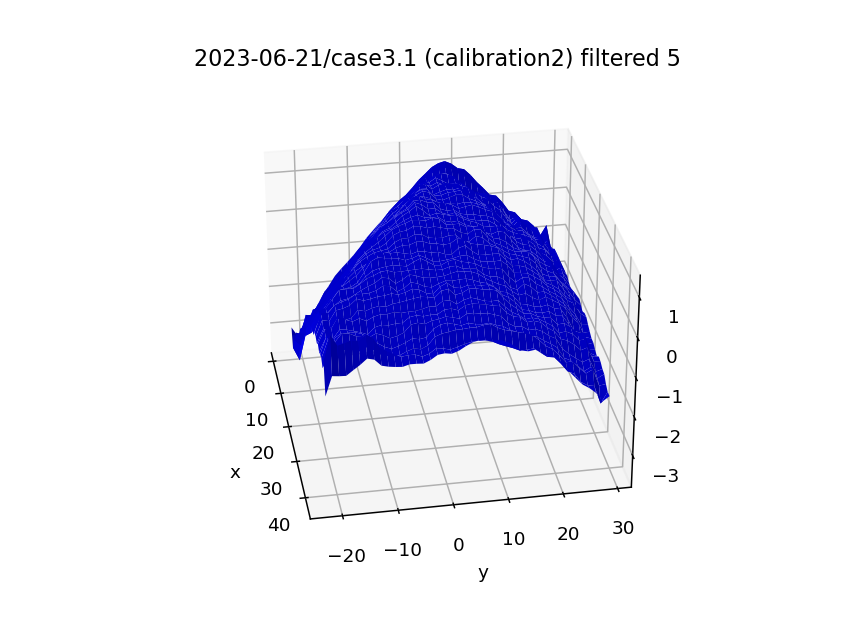

Segments2_compr_flat_filt_5_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.7828392056169231
std dev of height =  0.8593064678585784


<IPython.core.display.Javascript object>


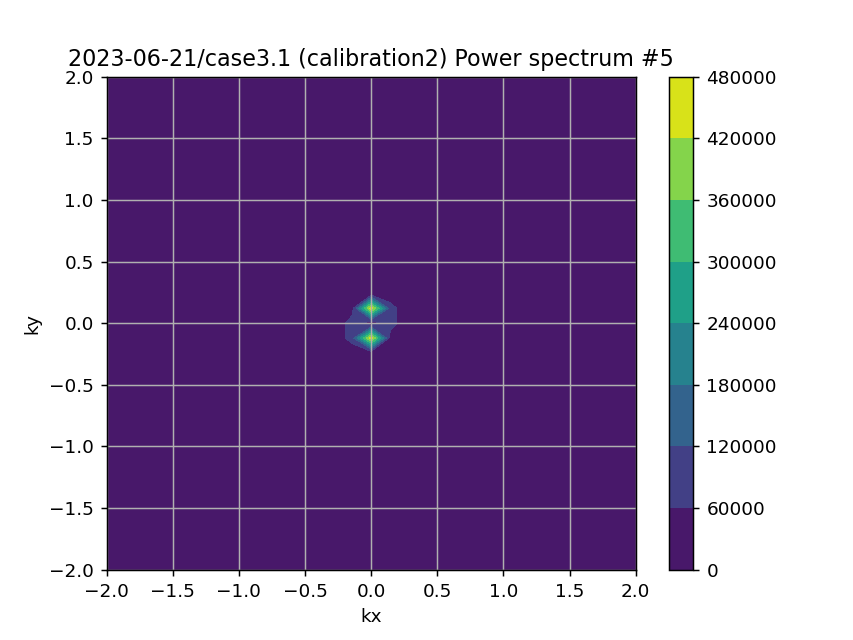

Working on segment  6
(38, 36)


<IPython.core.display.Javascript object>


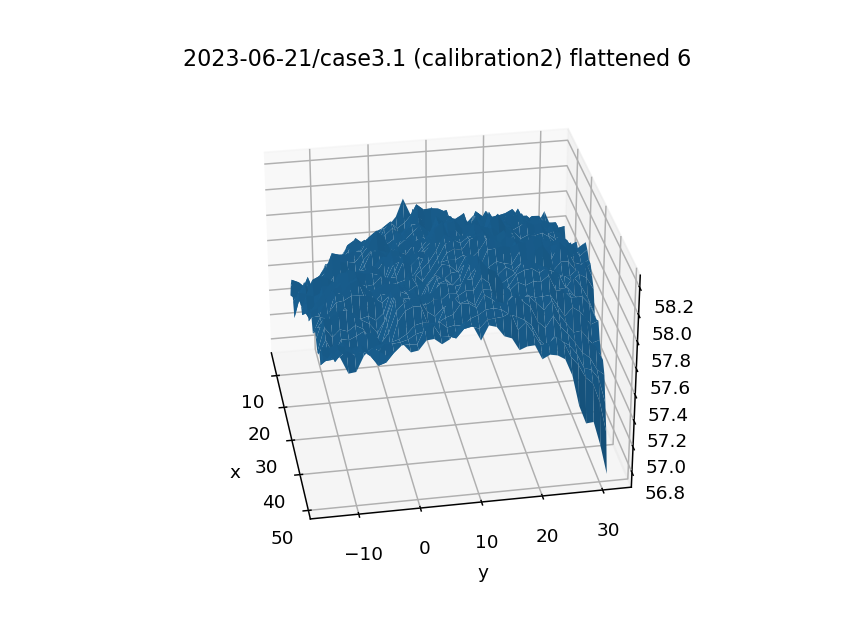

/var/folders/d4/79k8920n66j07rbcltjlhjx00000gr/T/ipykernel_36366/3329496731.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


<IPython.core.display.Javascript object>


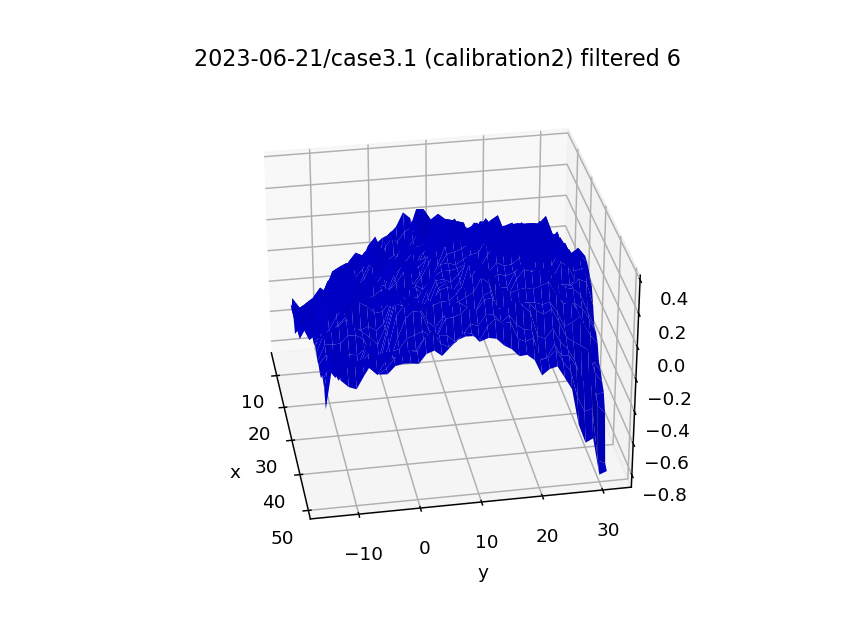

Segments2_compr_flat_filt_6_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.1802898502250854
std dev of height =  0.19660944960578194


<IPython.core.display.Javascript object>


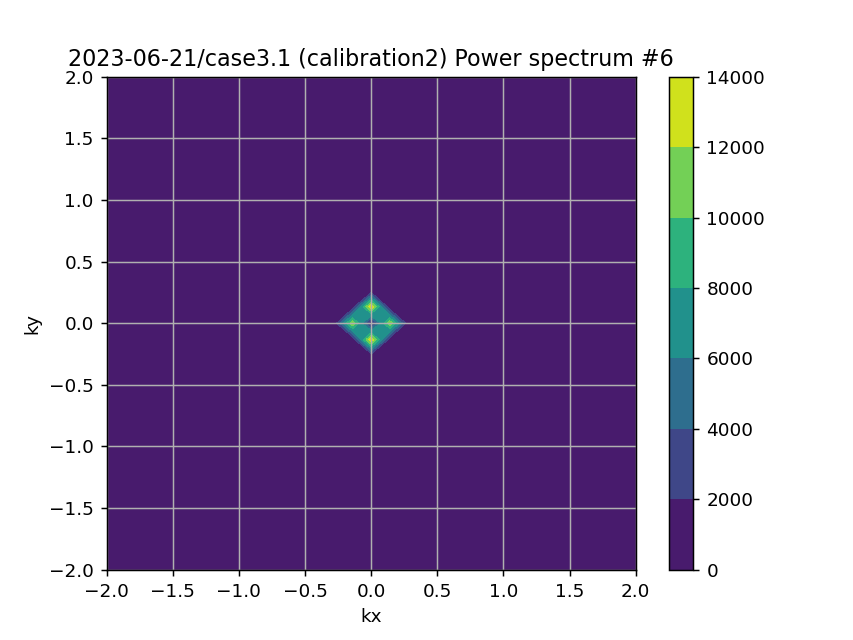

Working on segment  7
(38, 36)


<IPython.core.display.Javascript object>


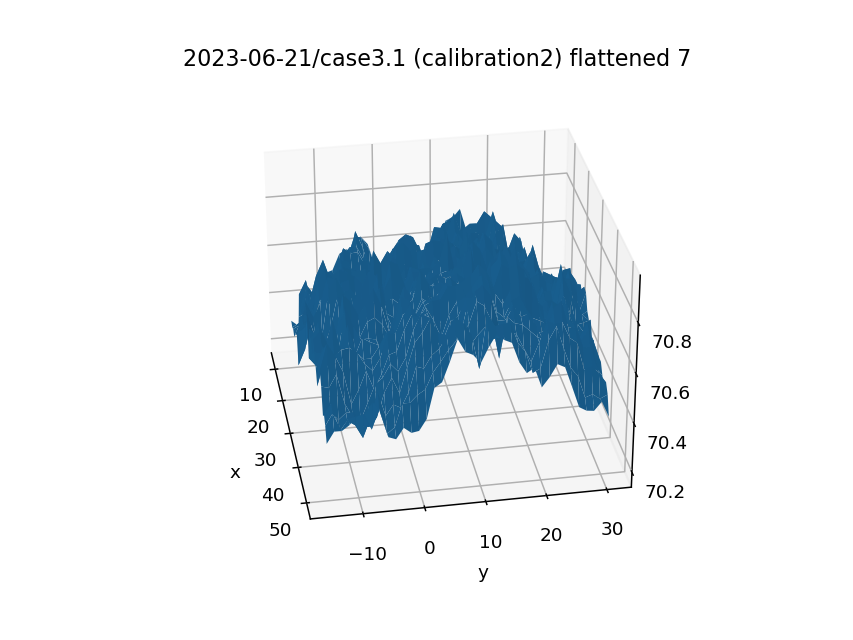

<IPython.core.display.Javascript object>


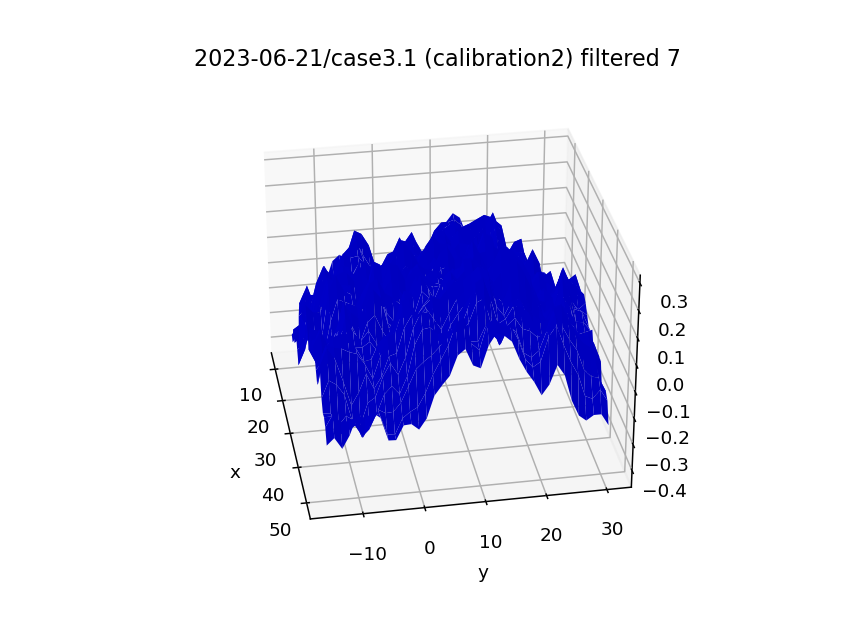

Segments2_compr_flat_filt_7_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.11510550117133929
std dev of height =  0.1314077715873148


<IPython.core.display.Javascript object>


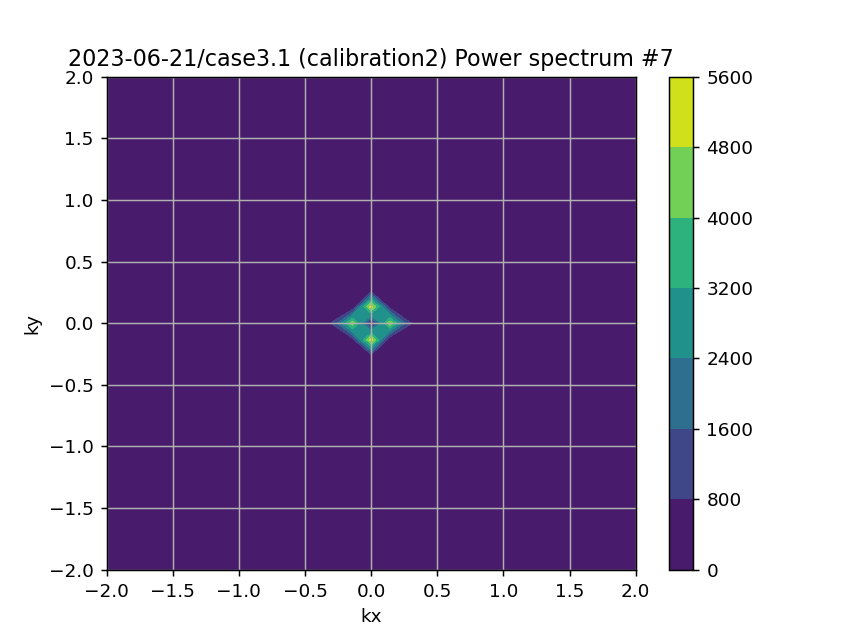

Working on segment  8
(54, 16)


<IPython.core.display.Javascript object>


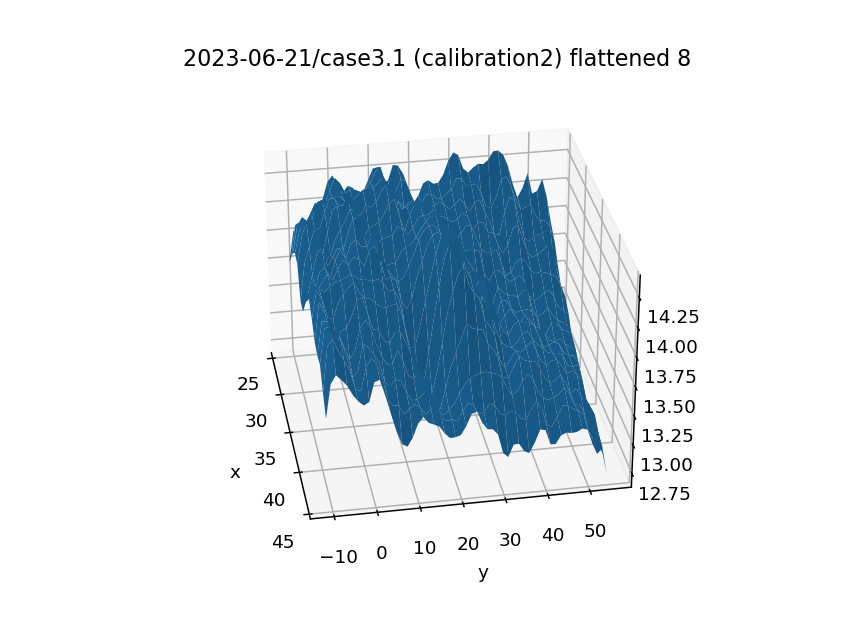

<IPython.core.display.Javascript object>


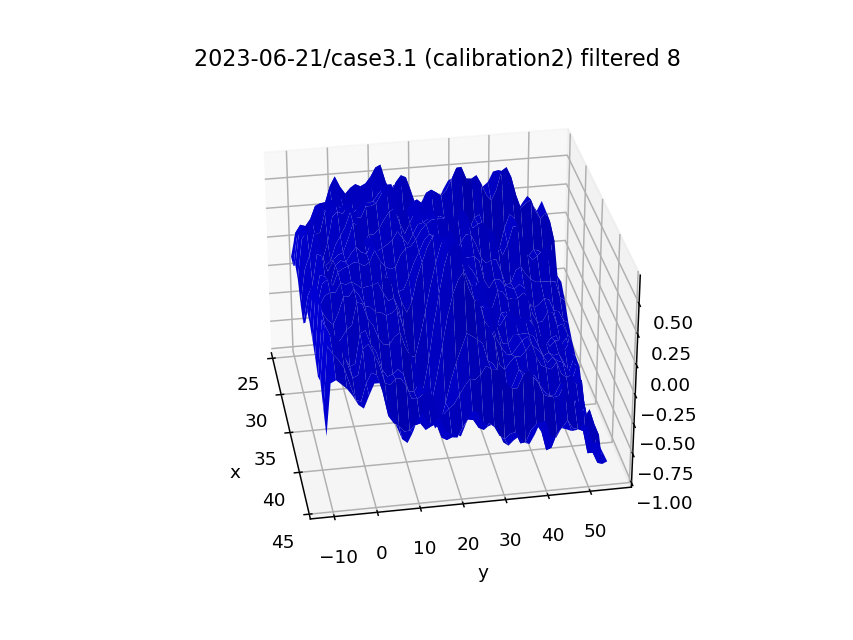

Segments2_compr_flat_filt_8_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.34033132099466407
std dev of height =  0.3931038901823793


<IPython.core.display.Javascript object>

Working on segment  9
(44, 31)


<IPython.core.display.Javascript object>


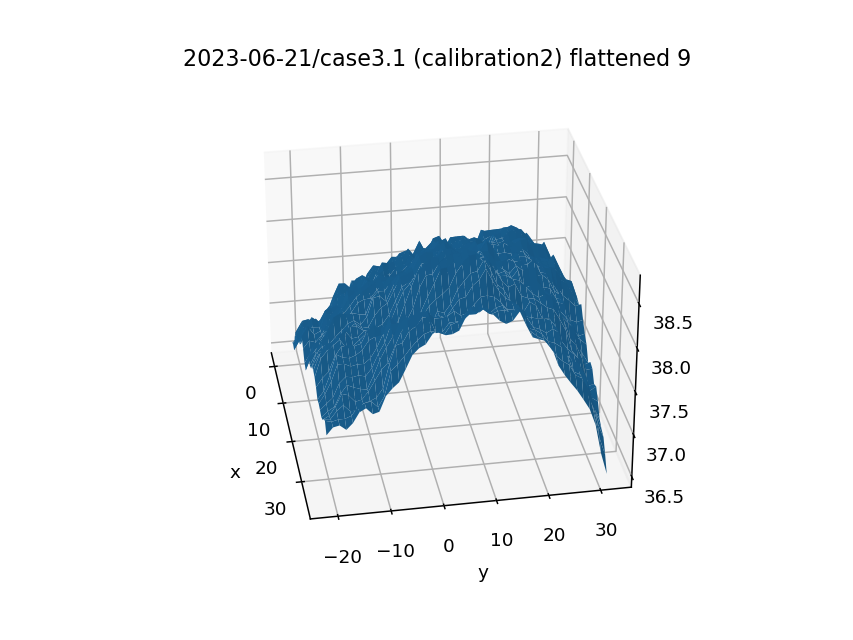

<IPython.core.display.Javascript object>


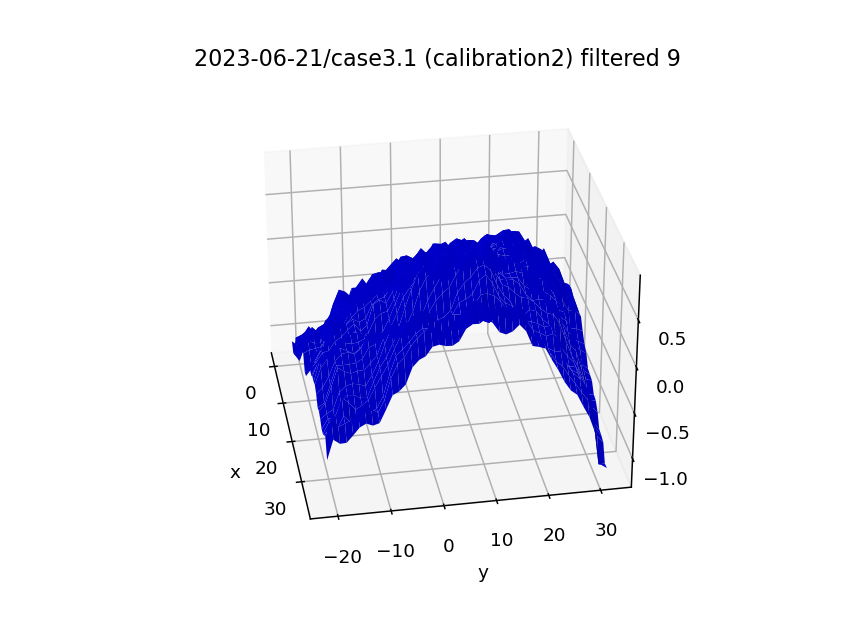

Segments2_compr_flat_filt_9_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.3965665653651243
std dev of height =  0.4348728322861977


<IPython.core.display.Javascript object>


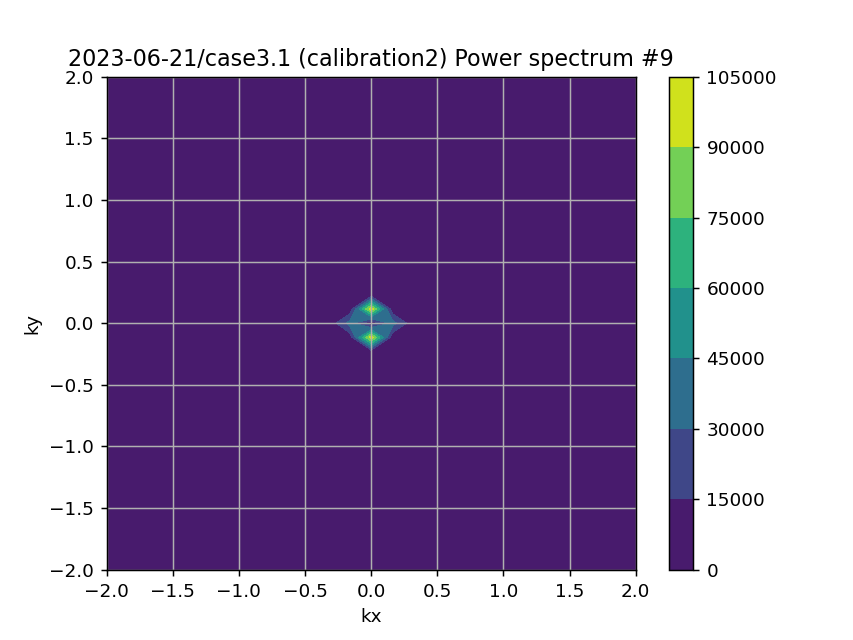

Working on segment  10
(40, 34)


<IPython.core.display.Javascript object>


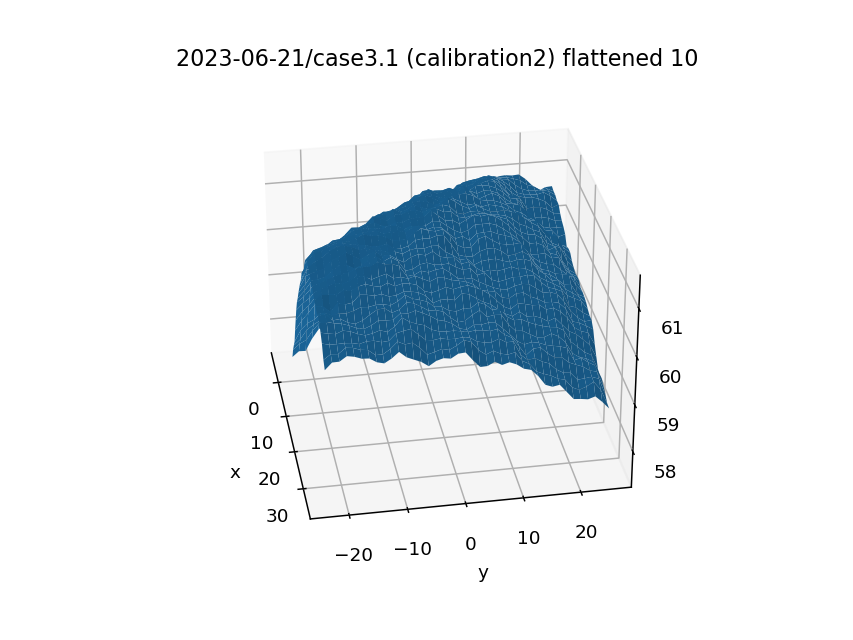

<IPython.core.display.Javascript object>


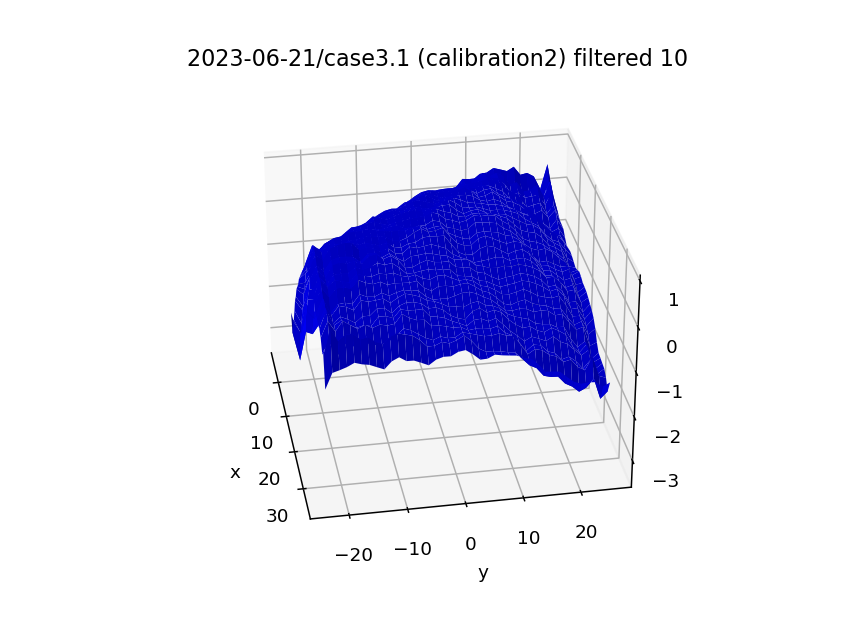

Segments2_compr_flat_filt_10_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.6707585295007285
std dev of height =  0.7433366573689827


<IPython.core.display.Javascript object>

Working on segment  11
(38, 36)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


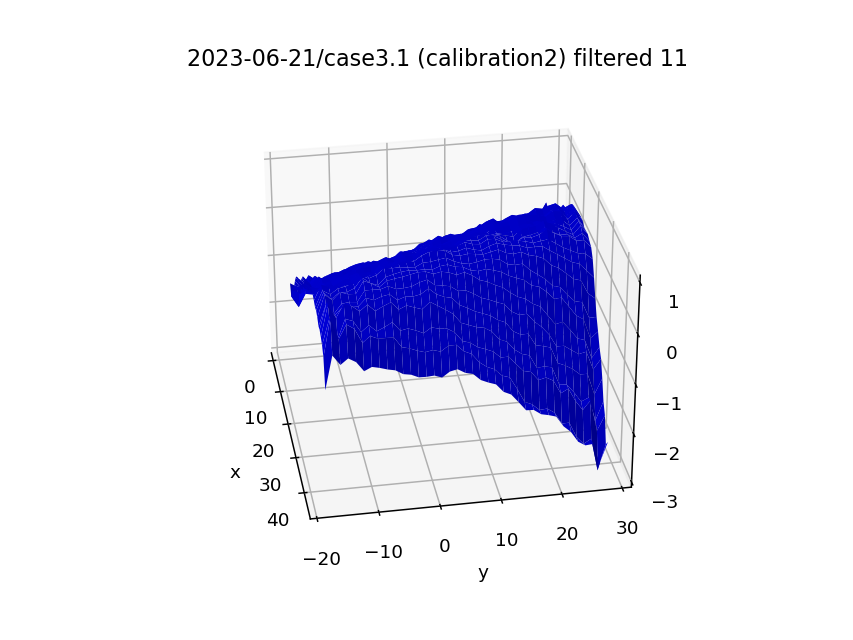

Segments2_compr_flat_filt_11_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.6467331729127503
std dev of height =  0.7315910180962752


<IPython.core.display.Javascript object>


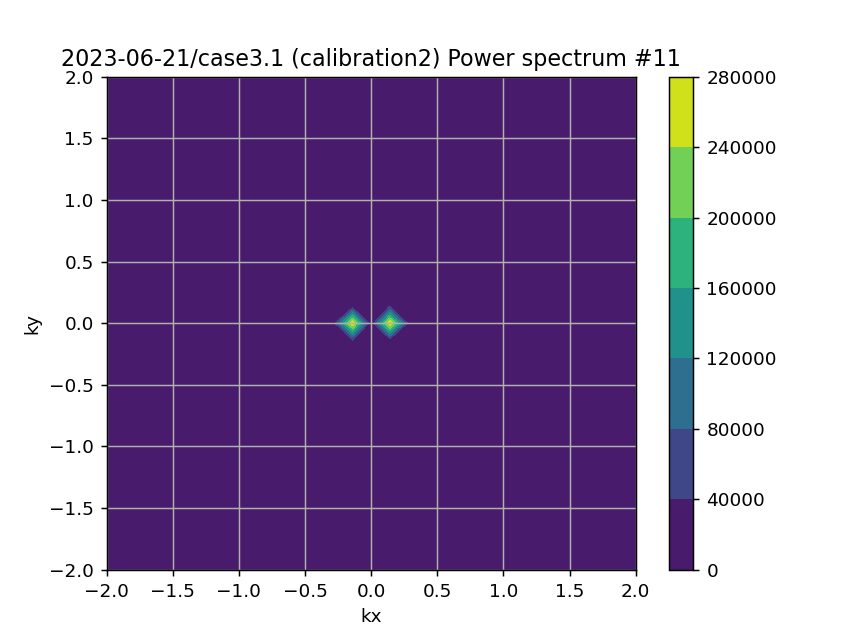

Working on segment  12
(57, 11)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


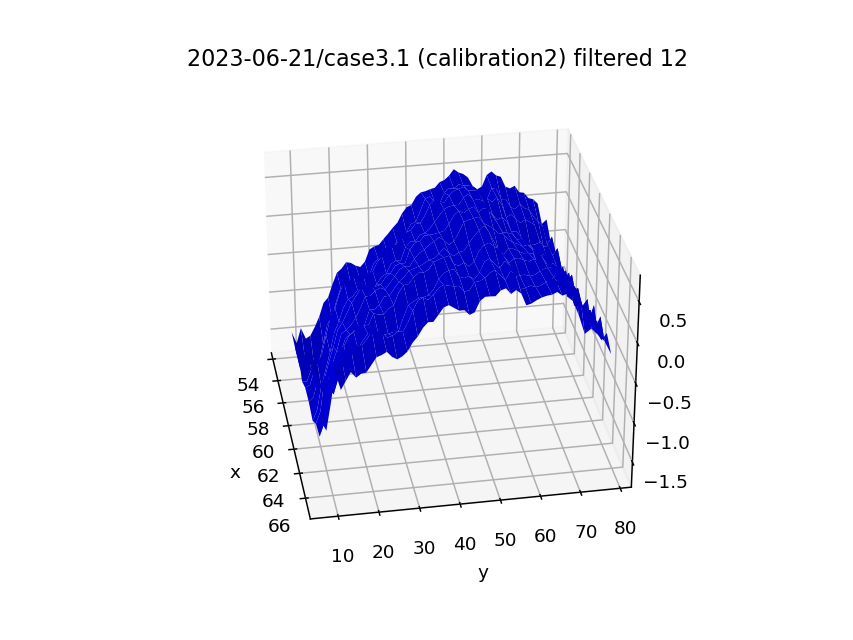

Segments2_compr_flat_filt_12_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.5632472913189656
std dev of height =  0.5725680123993871


<IPython.core.display.Javascript object>


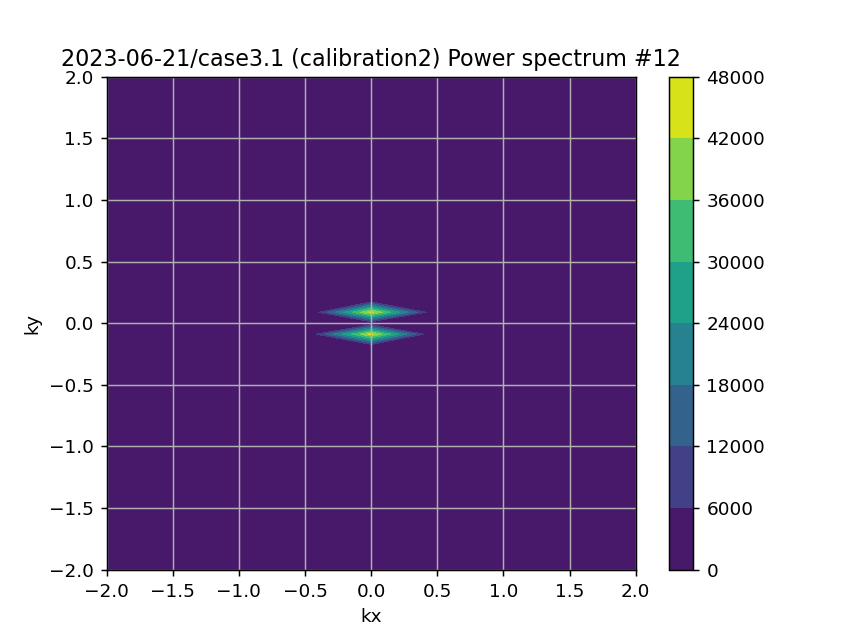

Working on segment  13
(48, 25)


<IPython.core.display.Javascript object>


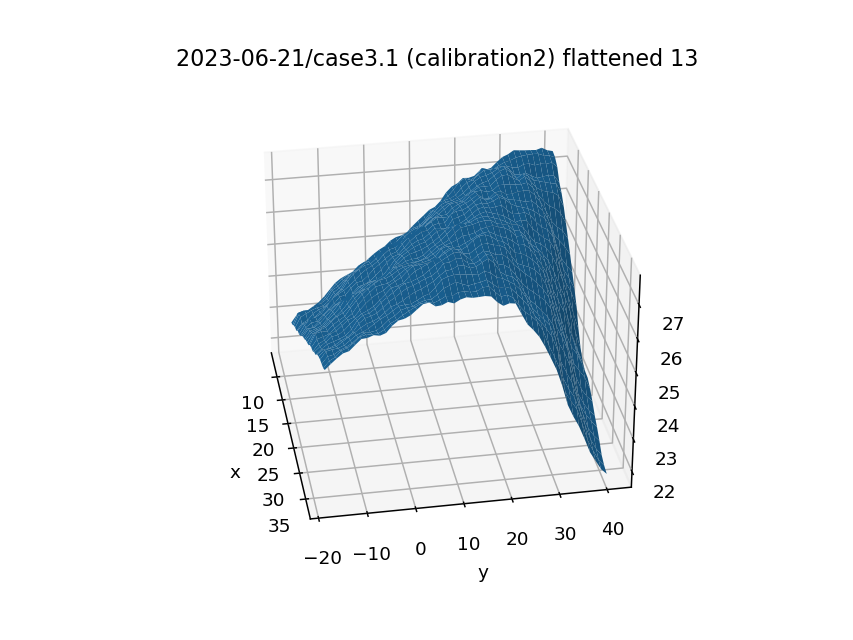

<IPython.core.display.Javascript object>

Segments2_compr_flat_filt_13_vx5.stl
Creating top mesh...
std dev of height (filtered) =  1.1676706348176542
std dev of height =  1.3082375444146364


<IPython.core.display.Javascript object>


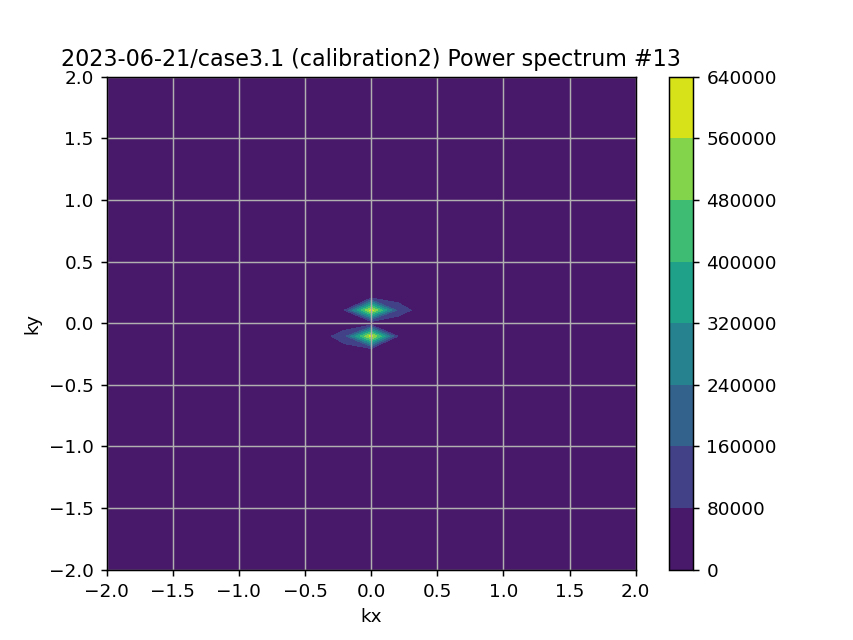

Working on segment  14
(41, 32)


<IPython.core.display.Javascript object>


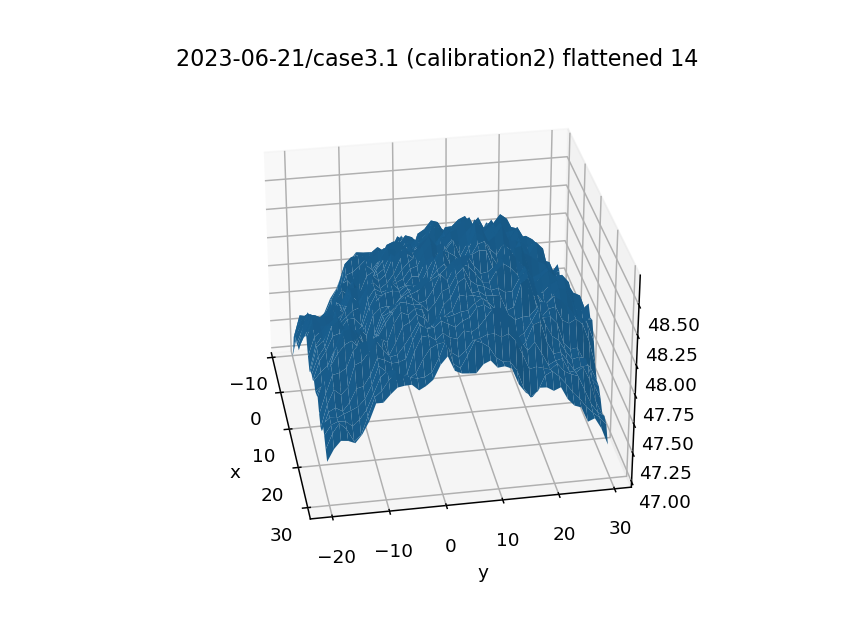

<IPython.core.display.Javascript object>


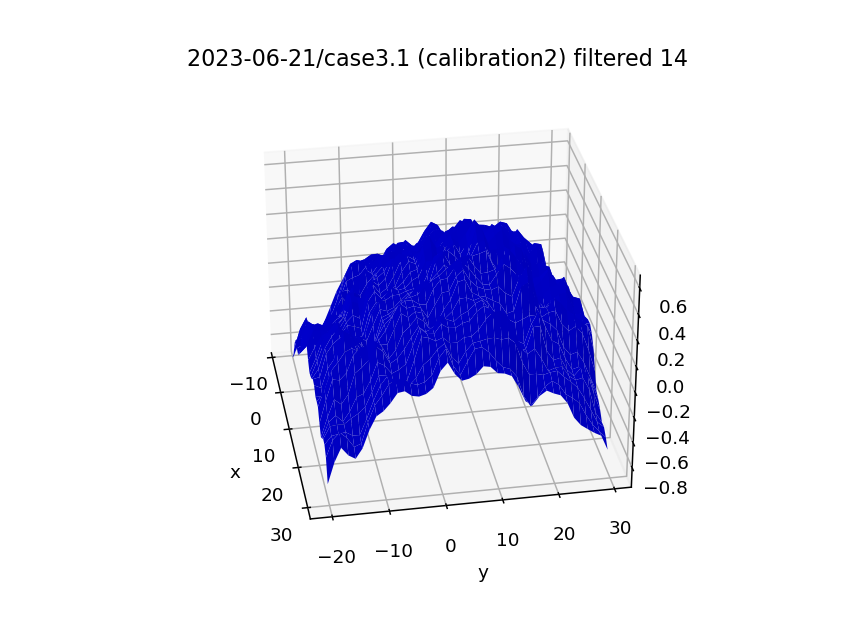

Segments2_compr_flat_filt_14_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.27376264571616893
std dev of height =  0.2998768857364754


<IPython.core.display.Javascript object>


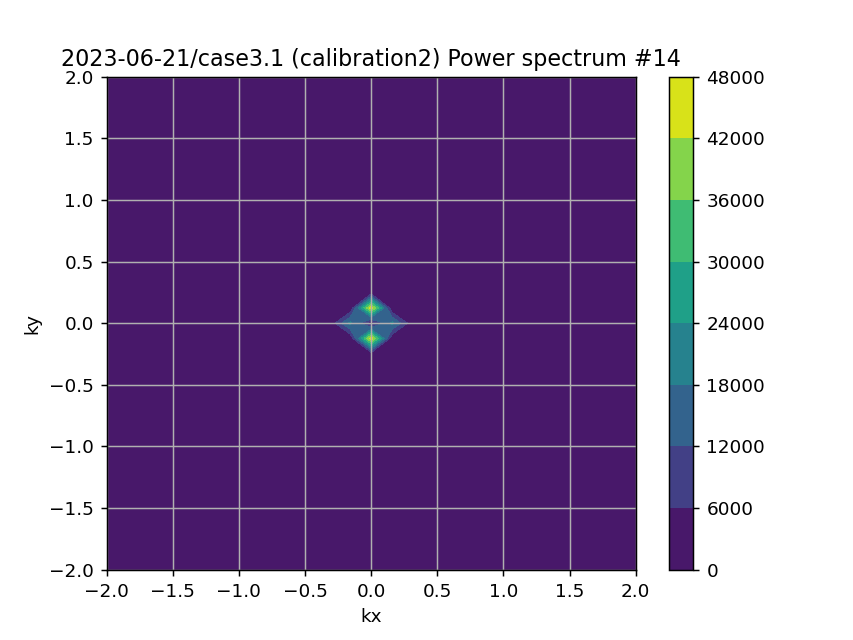

Working on segment  15
(39, 34)


<IPython.core.display.Javascript object>


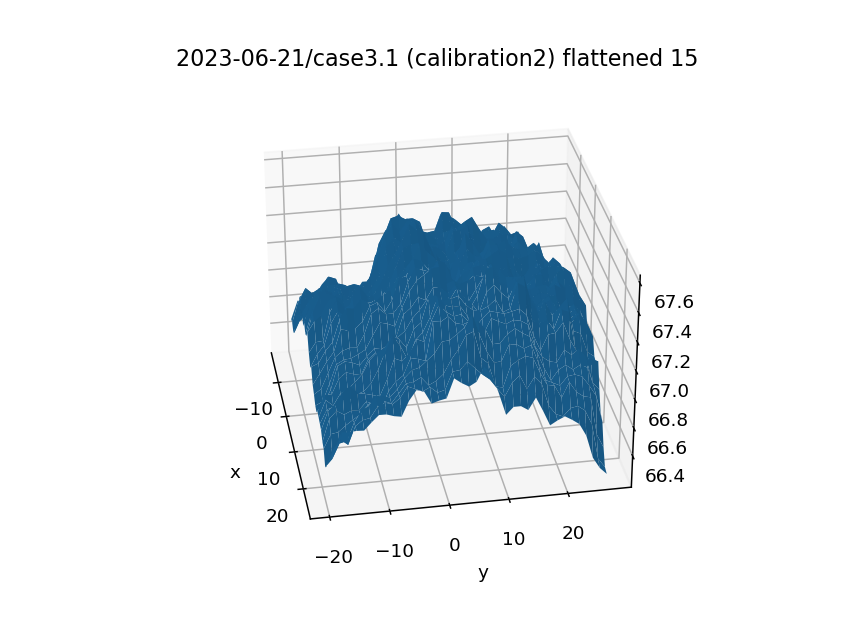

<IPython.core.display.Javascript object>


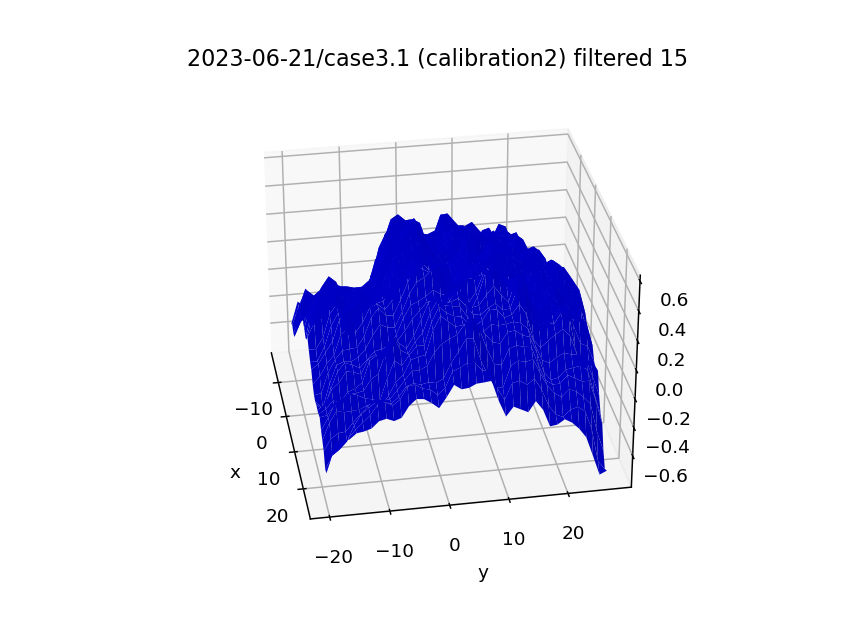

Segments2_compr_flat_filt_15_vx5.stl
Creating top mesh...
std dev of height (filtered) =  0.24450337185286075
std dev of height =  0.2710148703016879


<IPython.core.display.Javascript object>


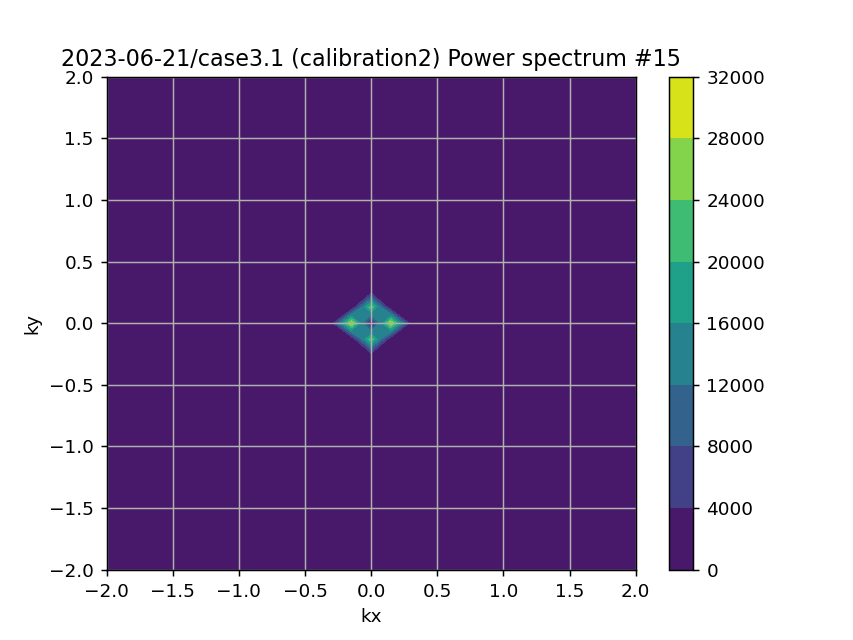

In [12]:
# Fourier transform, filter, and save them
plotthisone = [i for i in range(nsegments)]
vscale = 5
kmax = 2
xseggrid_filtered = []
yseggrid_filtered = []
zseggrid_filtered = []

for i in range(nsegments):
    
    # Reporting
    print('Working on segment ', i)
    
    # Get the next flattened surface
    xgrid = xseggrid[i]
    ygrid = yseggrid[i]
    sollast = zseggrid[i]
    x = xgrid[0,:]; dx = x[1]-x[0]
    y = ygrid[:,0]
    Ny, Nx = np.shape(sollast)

    # Offset to zero
    sollast_offset = np.mean(sollast)
    sollast_atzero = sollast-sollast_offset
    
    # FFT
    solution_filtered = fs.filterseg(kmax,xgrid,ygrid,sollast_atzero)
    sollast_FT_filtered_IFT_real = solution_filtered[0]; print(np.shape(sollast_FT_filtered_IFT_real))
    kxshiftgrid = solution_filtered[1]
    kyshiftgrid = solution_filtered[2]
    sollast_FTshift_square = solution_filtered[3]
    
    # Plot one of them
    if i in plotthisone:
        
        # Graphing the flattened surface as a mesh
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.plot_surface(xseggrid[i], yseggrid[i], zseggrid[i])
        ax.set_xlabel('x')
        ax.set_ylabel('y')
        ax.set_title(case_and_folder + ' flattened '+str(i))
        ax.view_init(30, -10)
                
        # Save an stl file
        #stlfilename = Segmentroot+'_compr_flat'+'_'+str(i)+'_vx'+str(vscale)+'.stl'; print(stlfilename)
        #sls.numpy2stl(np.fliplr(zseggrid[i]), stlfilename, scale=vscale/dx, solid=False)

        # Graphing the filtered flattened surface as a mesh
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.plot_surface(xseggrid[i], yseggrid[i], sollast_FT_filtered_IFT_real,color='blue')
        ax.set_xlabel('x')
        ax.set_ylabel('y')
        ax.set_title(case_and_folder + ' filtered '+str(i))
        ax.view_init(30, -10)
        
        # Save an stl file
        stlfilename = Segmentroot+'_compr_flat_filt'+'_'+str(i)+'_vx'+str(vscale)+'.stl'; print(stlfilename)
        sls.numpy2stl(np.fliplr(sollast_FT_filtered_IFT_real[1:-2,1:-2]), stlfilename, scale=vscale/dx, solid=False)
        
        # Report something about the heights
        print ('std dev of height (filtered) = ', np.std(sollast_FT_filtered_IFT_real[1:-2,1:-2]))
        print ('std dev of height = ', np.std(sollast))
        
        # FT plotting
        plt.figure()
        plt.contourf(kxshiftgrid, kyshiftgrid, sollast_FTshift_square)
        plt.colorbar()
        plt.xlim([-kmax,kmax])
        plt.ylim([-kmax,kmax])
        plt.xlabel('kx')
        plt.ylabel('ky')
        plt.title(case_and_folder + ' Power spectrum #'+str(i))
        plt.grid(True)
        
    # Pack the filtered segment into the big array (but getting rid of the edges)
    xseggrid_filtered.append(xgrid[1:-2,1:-2])
    yseggrid_filtered.append(ygrid[1:-2,1:-2])
    zseggrid_filtered.append(sollast_FT_filtered_IFT_real[1:-2,1:-2])

In [13]:
# Graphing the filtered flattened surface with plotly
print('plotting the last one')
fig = go.Figure(data=go.Surface(x=xseggrid[i],y=yseggrid[i],z=sollast_FT_filtered_IFT_real, colorscale="greys"))
fig.update_layout(scene = dict(
            xaxis_title='x',
            yaxis_title='y',
            zaxis_title='z'),
            title='test')

plotting the last one


In [14]:
# Do some uniforimization on the unfiltered array
nxmin,nymin = np.shape(xseggrid_filtered[0])
for i in range(len(xseggrid_filtered)):
    nx, ny = np.shape(xseggrid_filtered[i])
    if (nx<nxmin):
        nxmin = nx
    if (ny<nymin):
        nymin = ny
print('minima:', nxmin,nymin)
xseggrid_filtered_uni = []
yseggrid_filtered_uni = []
zseggrid_filtered_uni = []
for i in range(len(xseggrid_filtered)):
    xseggrid_filtered_uni.append(xseggrid_filtered[i][0:nxmin,0:nymin])
    yseggrid_filtered_uni.append(yseggrid_filtered[i][0:nxmin,0:nymin])
    zseggrid_filtered_uni.append(zseggrid_filtered[i][0:nxmin,0:nymin])

# Do some uniformization on the unfiltered array
nxmin,nymin = np.shape(xseggrid[0])
for i in range(len(xseggrid)):
    nx, ny = np.shape(xseggrid[i])
    if (nx<nxmin):
        nxmin = nx
    if (ny<nymin):
        nymin = ny
print('minima:', nxmin,nymin)
xseggrid_uni = []
yseggrid_uni = []
zseggrid_uni = []
for i in range(len(xseggrid_filtered)):
    xseggrid_uni.append(xseggrid[i][0:nxmin,0:nymin])
    yseggrid_uni.append(yseggrid[i][0:nxmin,0:nymin])
    zseggrid_uni.append(zseggrid[i][0:nxmin,0:nymin])

minima: 35 8
minima: 38 11


In [15]:
# Save the flattened segments
np.savez_compressed(Originalfilename, \
                    xgridtot=surf_xseggrid, \
                    ygridtot=surf_yseggrid, \
                    zgridtot=surf_zseggrid)

np.savez_compressed(Flattenedfilename, \
                    xgridtot=xseggrid_uni, \
                    ygridtot=yseggrid_uni, \
                    zgridtot=zseggrid_uni)

np.savez_compressed(Filteredfilename, \
                    xgridtot=xseggrid_filtered_uni, \
                    ygridtot=yseggrid_filtered_uni, \
                    zgridtot=zseggrid_filtered_uni)

In [16]:
# See if we can get some angles
ims.extractdots(npzfile,dx,dy)

0 1 0.935926063371026 20.621724398994647
0 2 0.8915844157536249 26.926975961787335
0 3 0.876573402542007 28.768262251074308
0 4 0.9770128009457113 12.308811515874167
0 5 0.9613592016369005 15.97971931131088
0 6 0.8931282109625429 26.730992566378408
0 7 0.8746618694380269 28.995016783492204
0 8 0.8753801452375597 28.910002339634794
0 9 0.9443473977390878 19.205047006059857
0 10 0.9141737516422402 23.911339989581784
0 11 0.8801879416445363 28.33495697592774
0 12 0.8627038879121491 30.37845554250419
0 13 0.8976992559581156 26.142726439566278
0 14 0.8893563572724008 27.207521857467764
0 15 0.8498798399520954 31.801397479955757
1 2 0.9932849027285606 6.643655607166349
1 3 0.988755433642439 8.600362998773116
1 4 0.9259115052898379 22.19379399454897
1 5 0.9841068972673288 10.228662509496633
1 6 0.9943021490397606 6.119269784448942
1 7 0.9890595269044901 8.48305781690896
1 8 0.7765355118253817 39.05554447320887
1 9 0.9445947443245205 19.161918101797234
1 10 0.9745937762476702 12.94289668382039

In [17]:
# # This is just trying to understand how the FT works
# i = 0
# x = xseggrid[i][0,:]
# y = yseggrid[i][:,0]
# xgrid,ygrid = np.meshgrid(x,y)
# test = xseggrid[0]
# Ny, Nx = np.shape(test)

# # FT
# test_FTshift,kxshift,kyshift = fs.FT(test,x,y)
# kxshiftgrid,kyshiftgrid = np.meshgrid(kxshift,kyshift);
# test_FTshift_square = np.real(test_FTshift)**2 +  np.imag(test_FTshift)**2 
# plt.figure()
# plt.contour(kxshiftgrid, kyshiftgrid, test_FTshift_square)
# plt.xlabel('kx')
# plt.ylabel('ky')
# plt.title('Power spectrum')
# plt.grid(True)

# # Filter
# kmax = 2.6
# test_FTshift_filtered = test_FTshift*1
# for ix in range(Nx):
#     for iy in range(Ny):
#         ktest = np.sqrt(kxshiftgrid[iy,ix]**2+kyshiftgrid[iy,ix]**2)
#         if(ktest>kmax):
#             test_FTshift_filtered[iy,ix]=0

# # Inverse FT
# test_FT_filtered_IFT = fs.IFT(test_FTshift_filtered)
# print(np.shape(test_FT_filtered_IFT))
# print(np.shape(xgrid))

# # Plotting
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.plot_surface(xseggrid[i], yseggrid[i], test)
# ax.set_xlabel('x')
# ax.set_ylabel('y')
# ax.set_title('original')
# ax.view_init(30, -10)

# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.plot_surface(xgrid, ygrid, np.real(test_FT_filtered_IFT),color='blue')
# ax.set_xlabel('x')
# ax.set_ylabel('y')
# ax.set_title('smoothed')
# ax.view_init(30, -10)

# # fig = plt.figure()
# # ax = fig.add_subplot(111, projection='3d')
# # ax.plot_surface(xgrid, ygrid, np.real(test_FT_filtered_IFT-test),color='red')
# # ax.set_xlabel('x')
# # ax.set_ylabel('y')
# # ax.set_title('real difference')
# # ax.view_init(30, -10)

In [18]:
# # More attempts to understand how the FT works
# x = np.linspace(0,20,50)
# y = np.linspace(0,20,51)
# xgrid,ygrid = np.meshgrid(x,y)
# lambdax = 5; kx = np.pi*2/lambdax; print(kx)
# lambday = 2; ky = np.pi*2/lambday; print(ky)
# sollast = np.sin(kx*xgrid) + np.sin(ky*ygrid)
# Ny, Nx = np.shape(sollast)

# # FT
# sollast_FTshift,kxshift,kyshift = fs.FT(sollast,x,y)
# kxshiftgrid,kyshiftgrid = np.meshgrid(kxshift,kyshift);
# sollast_FTshift_square = np.real(sollast_FTshift)**2 +  np.imag(sollast_FTshift)**2 


# # Plotting
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.plot_surface(xgrid, ygrid, sollast)
# ax.set_xlabel('x')
# ax.set_ylabel('y')
# ax.set_title('original')

# plt.figure()
# plt.contour(kxshiftgrid, kyshiftgrid, sollast_FTshift_square)
# plt.xlabel('kx')
# plt.ylabel('ky')
# plt.title('Power spectrum')
# plt.grid(True)
